In [88]:
import os
import torchvision
import torch
from PIL import Image
import matplotlib.pyplot as plt
import re
import numpy as np
from utils import InputPadder
import random
import h5py
import torch.nn as nn

In [89]:
class OpticalFlowRegression(nn.Module):
    def __init__(self, size):
        super(OpticalFlowRegression, self).__init__()
        self.H = size[0]
        self.W = size[1]
        
        pool_size = 4
        self.pool1 = nn.AvgPool2d(pool_size, stride=pool_size)
        H_pool = (self.H - pool_size) // pool_size + 1
        W_pool = (self.W - pool_size) // pool_size + 1
        
        self.flatten = nn.Flatten()
        
        self.linear_x = nn.Linear(H_pool*W_pool, H_pool*W_pool)
        self.linear_y = nn.Linear(H_pool*W_pool, H_pool*W_pool)
        self.pool = nn.AvgPool1d(H_pool*W_pool)
        

    def forward(self, x):               # x shape is Batch_size, 2, H, W
        flow_x = x[:,0,:,:]
        flow_y = x[:,1,:,:]
        
        flow_x = self.pool1(flow_x)
        flow_y = self.pool1(flow_y)
        
        flow_x = self.flatten(flow_x)
        flow_y = self.flatten(flow_y)
        
        linear_out_x = self.linear_x(flow_x)
        v_pred_x = self.pool(linear_out_x)
        linear_out_y = self.linear_y(flow_y)
        v_pred_y = self.pool(linear_out_y)
        
        
        out = torch.sqrt(v_pred_x**2 + v_pred_y**2)
        return out

In [2]:
files = ["2016-01-30--11-24-51.h5", "2016-01-30--13-46-00.h5", "2016-01-31--19-19-25.h5", 
"2016-02-02--10-16-58.h5", "2016-02-08--14-56-28.h5"]

model_path = "pretrained_raft.pt"
samples = 10

file_name = files[0]

video_path = os.path.join("camera", file_name)
with h5py.File(video_path, "r") as f:
    # Get the data
    frame_data = list(f['X'])
    print("Finished loading frames")
label_path = os.path.join("log", file_name)
with h5py.File(label_path, "r") as f:
    speed_label = np.array(list(f['speed']))
    speed_abs_label = np.array(list(f['speed_abs']))
    cam_ptr = np.array(list(f['cam1_ptr']))
    
np.random.seed(10086)
samples_id = np.random.randint(0, len(speed_label) - 100, samples)

# for i in range(samples):
#     label_id = samples_id[i]
#     frame_id = int(cam_ptr[label_id])
#     image1 = frame_data[frame_id]
#     image2 = frame_data[frame_id + 2]
#     image1 = torch.from_numpy(image1).float().to(device)
#     image2 = torch.from_numpy(image2).float().to(device)

#     image1 = image1.unsqueeze(0)
#     image2 = image2.unsqueeze(0)

#     flow = model(image1, image2)
#     flow = flow[-1].squeeze()

#     flow = flow.cpu()
#     write_flow(flow, os.path.join(flow_path, file_name + "_" + str(i).rjust(4, '0')+ ".flo"))

speeds = speed_label[samples_id]
 
print(f'Finished {file_name}')


Finished loading frames
Finished 2016-01-30--11-24-51.h5


(-0.5, 967.5, 487.5, -0.5)

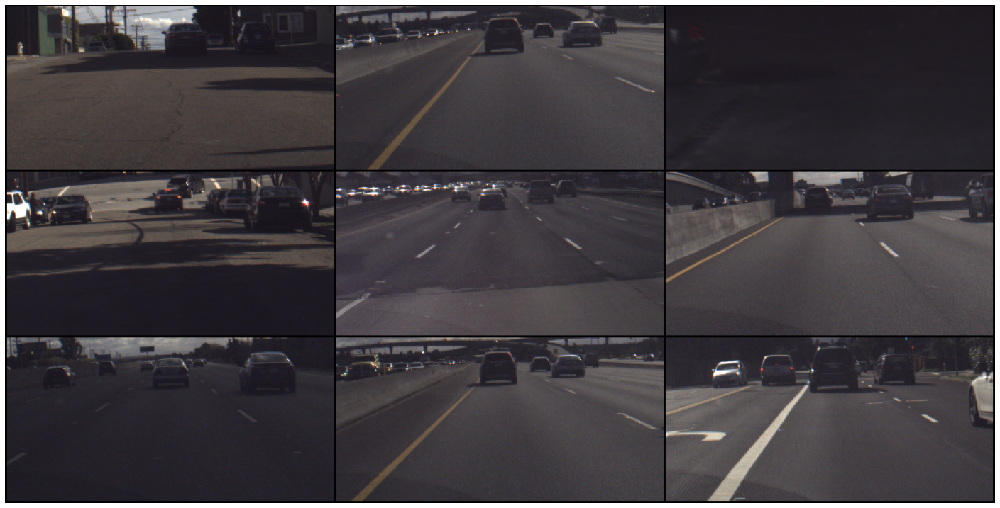

In [53]:
random.seed(10086)
indices = random.sample(range(len(frame_data)), 9)
sampler = [torch.from_numpy(frame_data[i]) for i in indices]
grid = torchvision.utils.make_grid(sampler, nrow=3)
img = torchvision.transforms.ToPILImage()(grid)
plt.figure(figsize=(25,25))
plt.imshow(img)
plt.axis('off')

In [69]:
image1 = frame_data[20000]
image2 = frame_data[20002]

In [70]:
image1.shape

(3, 160, 320)

Text(0.5, 1.0, 'Frame 1')

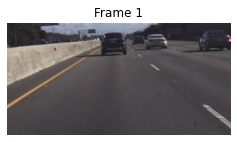

In [19]:
plt.figure(figsize=(4,4))
plt.imshow(image1.transpose(1,2,0))
plt.axis('off')
plt.title("Frame 1")

Text(0.5, 1.0, 'Frame 2')

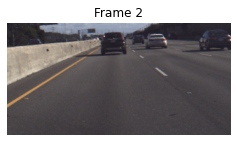

In [39]:
plt.figure(figsize=(4,4))
plt.imshow(image2.transpose(1,2,0))
plt.axis('off')
plt.title("Frame 2")

In [33]:
image1 = frame_data[20000]
image2 = frame_data[20002]
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
image1 = torch.from_numpy(image1).float().to(device)
image2 = torch.from_numpy(image2).float().to(device)
image1 = image1.unsqueeze(0)
image2 = image2.unsqueeze(0)

model_path = "pre_trained.pt"
model = torchvision.models.optical_flow.raft_small()
model.load_state_dict(torch.load(model_path))
model.eval()
model.to(device)

flow_old = model(image1, image2)
flow_old = flow_old[-1].squeeze()

flow_viz_old = torchvision.transforms.ToPILImage()(torchvision.utils.flow_to_image(flow_old))

model_path = "fintuned_raft.pt"
model = torchvision.models.optical_flow.raft_small()
model.load_state_dict(torch.load(model_path))
model.eval()
model.to(device)

flow_new = model(image1, image2)
flow_new = flow_new[-1].squeeze()

flow_viz_new = torchvision.transforms.ToPILImage()(torchvision.utils.flow_to_image(flow_new))

flow_viz_old = torchvision.transforms.functional.adjust_contrast(flow_viz_old, 0.9)
flow_viz_new = torchvision.transforms.functional.adjust_contrast(flow_viz_new, 1.1)


Text(0.5, 1.0, 'Flow from Pre-trained RAFT')

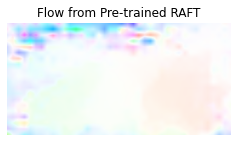

In [34]:
plt.figure(figsize=(4,4))
plt.imshow(flow_viz_old)
plt.axis('off')
plt.title("Flow from Pre-trained RAFT")

Text(0.5, 1.0, 'Flow from Fine-tuned RAFT')

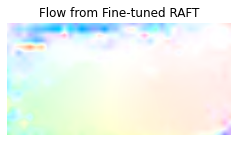

In [36]:
plt.figure(figsize=(4,4))
plt.imshow(flow_viz_new)
plt.axis('off')
plt.title("Flow from Fine-tuned RAFT")

In [2]:
sampler_path = "../cs231n/Sampler"
image1 = os.path.join(sampler_path, "Driving/RGB_cleanpass/left/0400.png")
image2 = os.path.join(sampler_path, "Driving/RGB_cleanpass/left/0401.png")
image3 = os.path.join(sampler_path, "Driving/RGB_cleanpass/left/0402.png") 

In [3]:
# Test model
def get_predict_flow(model, image1, image2):
    transform = torchvision.transforms.ToTensor()
    image1 = transform(Image.open(image1))
    image2 = transform(Image.open(image2))
    img_size = image1.shape[1:]

    padder = InputPadder(image1.shape)
    image1, image2 = padder.pad(image1, image2)
    image1 = image1.unsqueeze(0)
    image2 = image2.unsqueeze(0)
    output = model(image1, image2)

    output = output[-1]

    output = padder.unpad(output)
    output = output.squeeze()
        
    return output

In [4]:
# load model for RAFT
model = torchvision.models.optical_flow.raft_small(pretrained=True)
model.eval()

RAFT(
  (feature_encoder): FeatureEncoder(
    (convnormrelu): ConvNormActivation(
      (0): Conv2d(3, 32, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3))
      (1): InstanceNorm2d(32, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      (2): ReLU(inplace=True)
    )
    (layer1): Sequential(
      (0): BottleneckBlock(
        (convnormrelu1): ConvNormActivation(
          (0): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1))
          (1): InstanceNorm2d(8, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
          (2): ReLU(inplace=True)
        )
        (convnormrelu2): ConvNormActivation(
          (0): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
          (1): InstanceNorm2d(8, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
          (2): ReLU(inplace=True)
        )
        (convnormrelu3): ConvNormActivation(
          (0): Conv2d(8, 32, kernel_size=(1, 1), stride=(1, 1))
          (1): InstanceNorm

In [5]:
flow1 = get_predict_flow(model, image1, image2)
flow2 = get_predict_flow(model, image1, image3)
flow1_viz = torchvision.transforms.ToPILImage()(torchvision.utils.flow_to_image(flow1))
flow2_viz = torchvision.transforms.ToPILImage()(torchvision.utils.flow_to_image(flow2))



In [19]:
flow1_viz_c = torchvision.transforms.functional.adjust_contrast(flow1_viz, 0.9)
flow2_viz_c = torchvision.transforms.functional.adjust_contrast(flow2_viz, 1.1)

Text(0.5, 1.0, 'Flow - Slow')

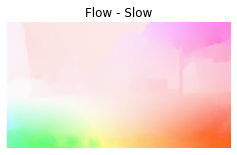

In [18]:
plt.figure(figsize=(4,4))
plt.imshow(flow1_viz_c)
plt.axis('off')
plt.title("Flow - Slow")

Text(0.5, 1.0, 'Flow - Fast')

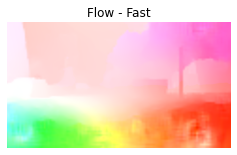

In [20]:
plt.figure(figsize=(4,4))
plt.imshow(flow2_viz_c)
plt.axis('off')
plt.title("Flow - Fast")

Text(0.5, 1.0, 'Frame 1')

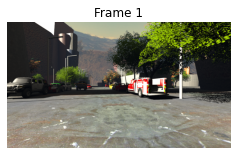

In [11]:
plt.figure(figsize=(4,4))
plt.imshow(Image.open(image1))
plt.axis('off')
plt.title("Frame 1")

Text(0.5, 1.0, 'Frame 2 - Slow')

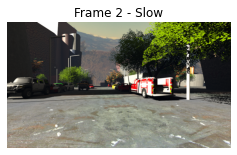

In [12]:
plt.figure(figsize=(4,4))
plt.imshow(Image.open(image2))
plt.axis('off')
plt.title("Frame 2 - Slow")

Text(0.5, 1.0, 'Frame 2 - Fast')

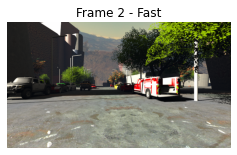

In [13]:
plt.figure(figsize=(4,4))
plt.imshow(Image.open(image3))
plt.axis('off')
plt.title("Frame 2 - Fast")

In [61]:
class TKitti_new(torchvision.datasets.KittiFlow):
    def __init__(self, root):
        super().__init__(root=root)
        
    def __getitem__(self, index):
        img1, img2, flow, valid_flow_mask = super().__getitem__(index)
        if (random.random() > 0.3):
            change_brightness = random.uniform(0.4, 1)
            img1 = torchvision.transforms.functional.adjust_brightness(img1, change_brightness)
            img2 = torchvision.transforms.functional.adjust_brightness(img2, change_brightness)
        
        if (random.random() > 0.3):
            change_contrast = random.uniform(0.5, 1)
            img1 = torchvision.transforms.functional.adjust_contrast(img1, change_contrast)
            img2 = torchvision.transforms.functional.adjust_contrast(img2, change_contrast)
        
        flow = torch.from_numpy(flow)
        valid_flow_mask = torch.from_numpy(valid_flow_mask)
        img1 = torchvision.transforms.ToTensor()(img1)
        img2 = torchvision.transforms.ToTensor()(img2)
        
        height = 368
        width = 1232
        img1 = torchvision.transforms.functional.crop(img1, 0, 0, height, width)
        img2 = torchvision.transforms.functional.crop(img2, 0, 0, height, width)
        flow = torchvision.transforms.functional.crop(flow, 0, 0, height, width)
        valid_flow_mask = torchvision.transforms.functional.crop(valid_flow_mask, 0, 0, height, width)
        return img1, img2, flow, valid_flow_mask

class TKitti_old(torchvision.datasets.KittiFlow):
    def __init__(self, root):
        super().__init__(root=root)
        
    def __getitem__(self, index):
        img1, img2, flow, valid_flow_mask = super().__getitem__(index)
        flow = torch.from_numpy(flow)
        valid_flow_mask = torch.from_numpy(valid_flow_mask)
        img1 = torchvision.transforms.ToTensor()(img1)
        img2 = torchvision.transforms.ToTensor()(img2)
        
        height = 368
        width = 1232
        img1 = torchvision.transforms.functional.crop(img1, 0, 0, height, width)
        img2 = torchvision.transforms.functional.crop(img2, 0, 0, height, width)
        flow = torchvision.transforms.functional.crop(flow, 0, 0, height, width)
        valid_flow_mask = torchvision.transforms.functional.crop(valid_flow_mask, 0, 0, height, width)
        return img1, img2, flow, valid_flow_mask


In [62]:
kitti_new = TKitti_new("../cs231n/Kitti")
kitti_old = TKitti_old("../cs231n/Kitti")
viz_loader_new = torch.utils.data.DataLoader(kitti_new, batch_size=1, shuffle=False)
viz_loader_old = torch.utils.data.DataLoader(kitti_old, batch_size=1, shuffle=False)


In [63]:
len(kitti_new)

200

(-0.5, 2469.5, 1481.5, -0.5)

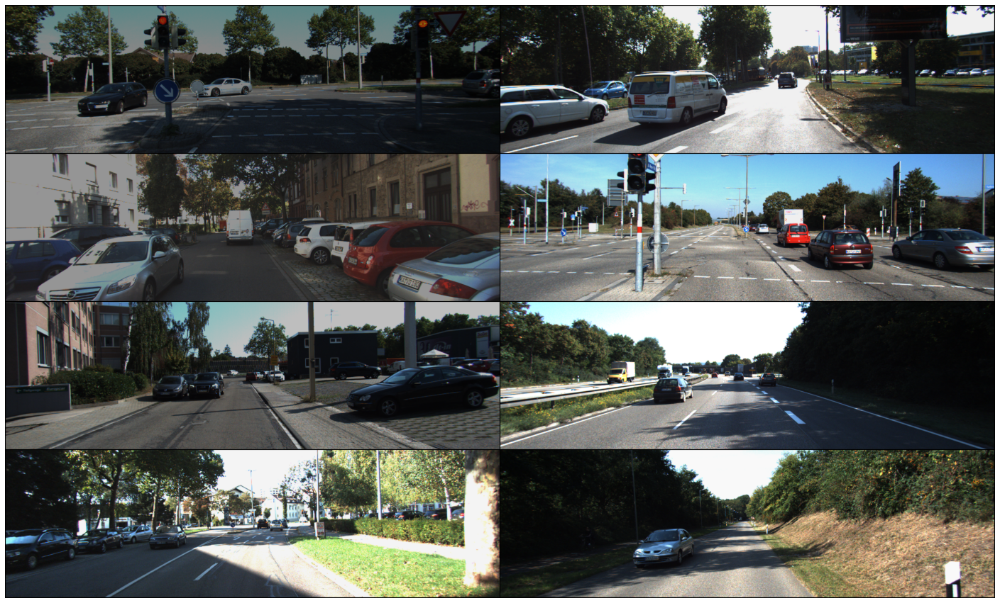

In [64]:
random.seed(10086)
indices = random.sample(range(200), 8)
sampler_new = [kitti_new[i][0] for i in indices]
sampler_old = [kitti_old[i][0] for i in indices]
grid_new = torchvision.utils.make_grid(sampler_new, nrow=2)
img_new = torchvision.transforms.ToPILImage()(grid_new)
plt.figure(figsize=(25,25))
plt.imshow(img_new)
plt.axis('off')

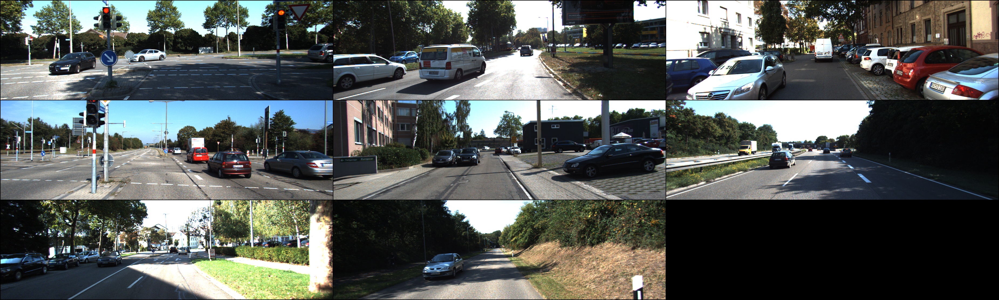

In [65]:
grid_old = torchvision.utils.make_grid(sampler_old, nrow=3)
img_old = torchvision.transforms.ToPILImage()(grid_old)
img_old.show()

Text(0.5, 1.0, 'Frame 1')

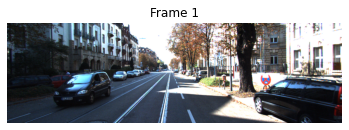

In [66]:
image1 = torchvision.transforms.ToPILImage()(kitti_old[0][0])
plt.figure(figsize=(6,6))
plt.imshow(image1)
plt.axis('off')
plt.title("Frame 1")

In [68]:
kitti_old[0][0].shape

torch.Size([3, 368, 1232])

Text(0.5, 1.0, 'Frame 2')

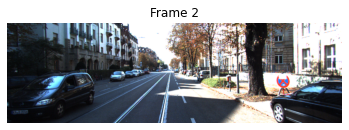

In [34]:
image2 = torchvision.transforms.ToPILImage()(kitti_old[0][1])
plt.figure(figsize=(6,6))
plt.imshow(image2)
plt.axis('off')
plt.title("Frame 2")

In [38]:
model_path = "pre_trained.pt"
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
model = torchvision.models.optical_flow.raft_small()
model.load_state_dict(torch.load(model_path))
model.eval()
model.to(device)

a = next(iter(viz_loader_old))
image1 = a[0].to(device)
image2 = a[1].to(device)
flow = model(image1, image2)
flow = flow[-1]
flow_viz = torchvision.transforms.ToPILImage()(torchvision.utils.flow_to_image(flow[-1]))
gt_viz = flow_viz = torchvision.transforms.ToPILImage()(torchvision.utils.flow_to_image(a[2].squeeze()))

Text(0.5, 1.0, 'Ground Truth')

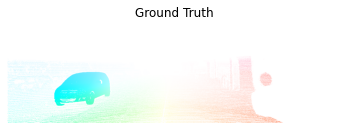

In [41]:
plt.figure(figsize=(6,6))
plt.imshow(gt_viz)
plt.axis('off')
plt.title("Ground Truth")

Text(0.5, 1.0, 'Prediction - Pre-trained RAFT')

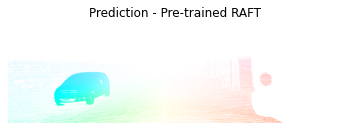

In [42]:
plt.figure(figsize=(6,6))
plt.imshow(flow_viz)
plt.axis('off')
plt.title("Prediction - Pre-trained RAFT")

In [46]:
model_path = "fintuned_raft.pt"
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
model = torchvision.models.optical_flow.raft_small()
model.load_state_dict(torch.load(model_path))
model.eval()
model.to(device)

a = next(iter(viz_loader_old))
image1 = a[0].to(device)
image2 = a[1].to(device)
flow = model(image1, image2)
flow = flow[-1]
valid_mask = a[3].to(device)
flow_viz = torchvision.transforms.ToPILImage()(torchvision.utils.flow_to_image(flow[-1] * valid_mask))


Text(0.5, 1.0, 'Prediction - Fine-tuned RAFT')

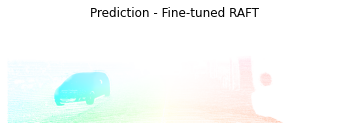

In [47]:
plt.figure(figsize=(6,6))
plt.imshow(flow_viz)
plt.axis('off')
plt.title("Prediction - Fine-tuned RAFT")

In [39]:
plot.add_subplot(rows, columns, 1)
plt.imshow(a[0].squeeze().permute(1,2,0))
plt.axis('off')
plt.title("Image 1")

plot.add_subplot(rows, columns, 2)
plt.imshow(a[1].squeeze().permute(1,2,0))
plt.axis('off')
plt.title("Image 2")

plot.add_subplot(rows, columns, 3)
plt.imshow(gt_viz)
plt.axis('off')
plt.title("GT")

plot.add_subplot(rows, columns, 4)
plt.imshow(flow_viz)
plt.axis('off')
plt.title("prediction")

NameError: name 'plot' is not defined

In [225]:
large_finetuned = torch.load("results_new/large_data_finetuned.txt")
large_video.keys()

dict_keys(['train_losses', 'val_losses', 'epochs', 'lr', 'reg', 'eps', 'down_sample_rate', 'batch_size'])

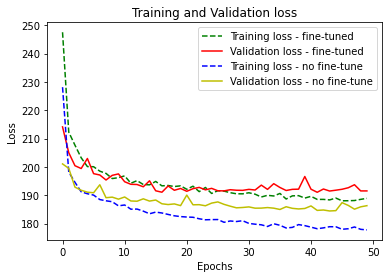

In [228]:
plt.plot(range(large_finetuned['epochs']), large_finetuned['train_losses'], '--g', label = "Training loss - fine-tuned")
plt.plot(range(large_finetuned['epochs']), large_finetuned['val_losses'], 'r', label = "Validation loss - fine-tuned")
plt.plot(range(large_video['epochs']), large_video['train_losses'], '--b', label = "Training loss - no fine-tune")
plt.plot(range(large_video['epochs']), large_video['val_losses'], 'y', label = "Validation loss - no fine-tune")

plt.title('Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

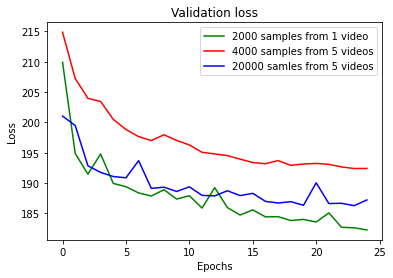

In [223]:
plt.plot(range(25), one_video['val_losses'][:25], 'g', label = "2000 samples from 1 video")
plt.plot(range(25), mul_video['val_losses'][:25], 'r', label = "4000 samples from 5 videos")
plt.plot(range(25), large_video['val_losses'][:25], 'b', label = "20000 samles from 5 videos")
plt.title('Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

In [212]:
print(one_video['val_losses'][0], one_video['val_losses'][-1])

209.930986328125 180.48899353027343


In [201]:
sf = 13000
sf_id = (np.where(cam_ptr == 28000*1))[0][0]


In [202]:
image1 = frame_data[sf]
image2 = frame_data[sf+2]
image3 = frame_data[sf+4]
image4 = frame_data[sf+8]
image5 = frame_data[sf+10]
images = [image1, image2, image3, image4, image5]

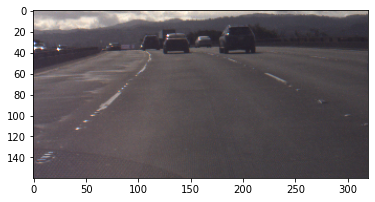

In [203]:
plt.imshow(image1.transpose(1,2,0))

In [204]:
gt1 = speed_abs_label[sf_id]
gt2 = speed_abs_label[sf_id+10]
gt3 = speed_abs_label[sf_id+20]
gt4 = speed_abs_label[sf_id+30]
gt5 = speed_abs_label[sf_id+40]
gts = [gt1, gt2, gt3, gt4, gt5]

In [205]:
raft_model_path = "pre_trained.pt"
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
raft_model = torchvision.models.optical_flow.raft_small()
raft_model.load_state_dict(torch.load(raft_model_path))
raft_model.eval()
raft_model.to(device)

model_path = "results_new/one_video.pt"
model =  OpticalFlowRegression((160, 320))
model.load_state_dict(torch.load(model_path))
model.eval()
model.to(device)
    

OpticalFlowRegression(
  (pool1): AvgPool2d(kernel_size=4, stride=4, padding=0)
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (linear_x): Linear(in_features=3200, out_features=3200, bias=True)
  (linear_y): Linear(in_features=3200, out_features=3200, bias=True)
  (pool): AvgPool1d(kernel_size=(3200,), stride=(3200,), padding=(0,))
)

In [206]:
flows = []
for i in range(4):
    image1 = torch.from_numpy(images[i]).to(device).unsqueeze(0).float()
    image2 = torch.from_numpy(images[i+1]).to(device).unsqueeze(0).float()
    flow = raft_model(image1, image2)
    flows.append(flow[-1])

In [207]:
preds = []
for i in range(4):
    pred = model(flows[i])
    preds.append(pred.item())

In [208]:
print(gts)

[32.97325138801444, 32.90564187870669, 32.945333298054095, 32.93187826579017, 32.91519964080063]


In [209]:
print(preds)

[26.519052505493164, 18.860454559326172, 26.05189323425293, 28.232057571411133]


Text(0.5, 1.0, 'Speed = 32.92')

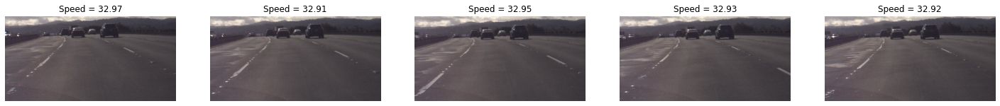

In [210]:
rows = 1
columns = 5

img = plt.figure(figsize=(25,25))
img.tight_layout()

img.add_subplot(rows, columns, 1)
plt.imshow(images[0].transpose(1,2,0))
plt.axis('off')
plt.title("Speed = "+ str(round(gts[0], 2)))

img.add_subplot(rows, columns, 2)
plt.imshow(images[1].transpose(1,2,0))
plt.axis('off')
plt.title("Speed = "+ str(round(gts[1], 2)))

img.add_subplot(rows, columns, 3)
plt.imshow(images[2].transpose(1,2,0))
plt.axis('off')
plt.title("Speed = "+ str(round(gts[2], 2)))

img.add_subplot(rows, columns, 4)
plt.imshow(images[3].transpose(1,2,0))
plt.axis('off')
plt.title("Speed = "+ str(round(gts[3], 2)))

img.add_subplot(rows, columns, 5)
plt.imshow(images[4].transpose(1,2,0))
plt.axis('off')
plt.title("Speed = "+ str(round(gts[4], 2)))

(-0.5, 319.5, 159.5, -0.5)

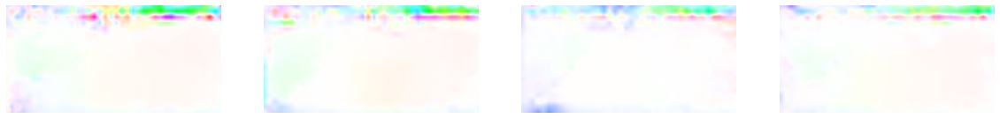

In [211]:
rows = 1
columns = 4

img = plt.figure(figsize=(20,20))
img.tight_layout()

flow_viz = torchvision.transforms.ToPILImage()(torchvision.utils.flow_to_image(flows[0].squeeze()))
img.add_subplot(rows, columns, 1)
plt.imshow(flow_viz)
plt.axis('off')

flow_viz = torchvision.transforms.ToPILImage()(torchvision.utils.flow_to_image(flows[1].squeeze()))
img.add_subplot(rows, columns, 2)
plt.imshow(flow_viz)
plt.axis('off')

flow_viz = torchvision.transforms.ToPILImage()(torchvision.utils.flow_to_image(flows[2].squeeze()))
img.add_subplot(rows, columns, 3)
plt.imshow(flow_viz)
plt.axis('off')

flow_viz = torchvision.transforms.ToPILImage()(torchvision.utils.flow_to_image(flows[3].squeeze()))
img.add_subplot(rows, columns, 4)
plt.imshow(flow_viz)
plt.axis('off')

In [167]:
flows[1]

tensor([[[[ 3.6663,  1.7029, -0.2605,  ..., -6.6676, -7.5922, -8.5169],
          [ 1.0404, -0.8034, -2.6471,  ..., -5.3589, -5.9731, -6.5873],
          [-1.5856, -3.3097, -5.0338,  ..., -4.0503, -4.3540, -4.6578],
          ...,
          [-3.5534, -2.4828, -1.4121,  ..., -1.8697, -1.9569, -2.0441],
          [-3.6810, -2.5988, -1.5165,  ..., -2.8229, -2.6187, -2.4144],
          [-3.8087, -2.7147, -1.6208,  ..., -3.7761, -3.2804, -2.7848]],

         [[15.3550, 14.9508, 14.5465,  ...,  2.8893,  2.6454,  2.4015],
          [16.1286, 15.7393, 15.3500,  ...,  2.5718,  2.3481,  2.1244],
          [16.9022, 16.5279, 16.1536,  ...,  2.2542,  2.0507,  1.8473],
          ...,
          [ 0.0831, -1.9490, -3.9810,  ...,  6.6978,  7.5380,  8.3782],
          [ 8.2570,  5.2355,  2.2141,  ...,  7.1689,  7.9945,  8.8201],
          [16.4308, 12.4200,  8.4092,  ...,  7.6400,  8.4511,  9.2621]]]],
       device='cuda:0', grad_fn=<MulBackward0>)